## Imports and global variables

In [1]:
import os
import random
import mlflow
import time
from collections import Counter
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import pickle

from PIL import Image

import torch
from torch.utils.data import DataLoader, WeightedRandomSampler, TensorDataset, DataLoader, RandomSampler, SequentialSampler, random_split
from torch import nn
from torch.optim import Adam
from torch.nn import Linear, ReLU, Dropout, LayerNorm, Sequential, CrossEntropyLoss
from torch.cuda import is_available
from torch.optim.lr_scheduler import ReduceLROnPlateau
from torch.nn.functional import softmax

from torchvision import models
from torchvision import transforms
from torchvision.models import (
    ResNet50_Weights, MobileNet_V2_Weights, EfficientNet_B0_Weights, 
    Inception_V3_Weights, DenseNet201_Weights, DenseNet161_Weights,
    GoogLeNet_Weights, VGG19_Weights
)
from torchvision.datasets import ImageFolder

import transformers
from transformers import AutoModel, BertTokenizerFast

from sklearn.metrics import classification_report, confusion_matrix
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from sklearn.utils.class_weight import compute_class_weight

device = "cuda" if is_available() else "cpu"

# a5_data_path = 'drive/MyDrive/AML/Assignment 5/data'
a5_data_path = './data'

C:\Users\Shankar\.conda\envs\DL-1\lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


## EDA and Preprocessing

In [2]:
folder_path = a5_data_path + '/dermnet'

def files_in_directory(directory_path):
    return [file for file in os.listdir(directory_path) if os.path.isfile(os.path.join(directory_path, file))]

def get_random_files(directory_path, num_files=5):
    all_files = [file for file in os.listdir(directory_path) if os.path.isfile(os.path.join(directory_path, file))]
    random_files = random.sample(all_files, num_files) if len(all_files) >= num_files else all_files
    return random_files

def load_image(file_path):
    img = Image.open(file_path).convert("RGB")
    return img

def dataset_summary(dataset):
    class_counts = {
    }

    for label in train_classes:
        class_counts[label] = len(files_in_directory(folder_path + '/' + dataset + '/' + label))
    
    print(f"{dataset} Set Summary:")
    print(f"Total Samples: {len(dataset)}")
    print(f"Class Distribution: {dict(class_counts)}")
    print()
    plt.bar(class_counts.keys(), class_counts.values(), tick_label=train_classes)
    plt.title(f"Class Distribution in {dataset} Set")
    plt.xlabel("Class")
    plt.ylabel("Count")
    plt.show()

def show_random_images(dataset, n=5):

    for label in train_classes:
        plt.figure(figsize=(10, 5))
        random_files = get_random_files(folder_path + '/' + dataset + '/' + label,n)

        for i in range(n):
            img = load_image(folder_path + '/' + dataset + '/' + label + '/' + random_files[i])
            plt.subplot(1, n, i+1)
            plt.imshow(img)
            plt.axis("off")
        plt.title("Label: " + label)    
        plt.show()

def inspect_image_data(dataset):
    heights = []
    widths = []
    pixel_means = []
    pixel_stds = []

    for label in train_classes:
        fpth = folder_path + '/' + dataset + '/' + label
        
        for file in files_in_directory(fpth):
            img = np.array(load_image(fpth + '/' + file))
            heights.append(img.shape[1])
            widths.append(img.shape[2])
            pixel_means.append(np.mean(img))
            pixel_stds.append(np.std(img))


    print(f"Image Height: Min = {min(heights)}, Max = {max(heights)}")
    print(f"Image Width: Min = {min(widths)}, Max = {max(widths)}")
    print(f"Pixel Intensity Mean: {np.mean(pixel_means):.4f}")
    print(f"Pixel Intensity Std: {np.mean(pixel_stds):.4f}")

# Define transformation
my_transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.RandomHorizontalFlip(),
    transforms.RandomRotation(45),
    transforms.ColorJitter(),
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225]) #ImageNet Weights
])


def denormalize(normalized_tensor):
    mean = torch.tensor([0.485, 0.456, 0.406]).view(3, 1, 1)
    std = torch.tensor([0.229, 0.224, 0.225]).view(3, 1, 1)
    denormalized_tensor = normalized_tensor * std + mean  # Reverse normalization
    return denormalized_tensor

def show_transformed_images(dataset, n=5):
    
    for label in train_classes:
        plt.figure(figsize=(10, 5))
        
        random_files = get_random_files(folder_path + '/' + dataset + '/' + label,n)

        for i in range(n):
            img = load_image(folder_path + '/' + dataset + '/' + label + '/' + random_files[i])
            transformed_img = denormalize(my_transform(img))
            transformed_img = transforms.ToPILImage()(transformed_img)
            plt.subplot(1, n, i+1)
            plt.imshow(transformed_img)
            plt.axis("off")

        plt.title(f"Label: Transformed: " + label)
        plt.show()

In [3]:
train_classes = os.listdir('./data/dermnet/train')
test_classes = os.listdir('./data/dermnet/test')

set(train_classes) == set(test_classes)

True

In [4]:
train_classes = os.listdir('./data/dermnet_processed/train')
folder_path = a5_data_path + '/dermnet_processed'

train Set Summary:
Total Samples: 5
Class Distribution: {'0': 840, '1': 1149, '10': 420, '11': 463, '12': 1040, '13': 260, '14': 1405, '15': 431, '16': 1371, '17': 606, '18': 1300, '19': 212, '2': 489, '20': 482, '21': 416, '22': 1086, '3': 448, '4': 288, '5': 1235, '6': 404, '7': 239, '8': 405, '9': 568}



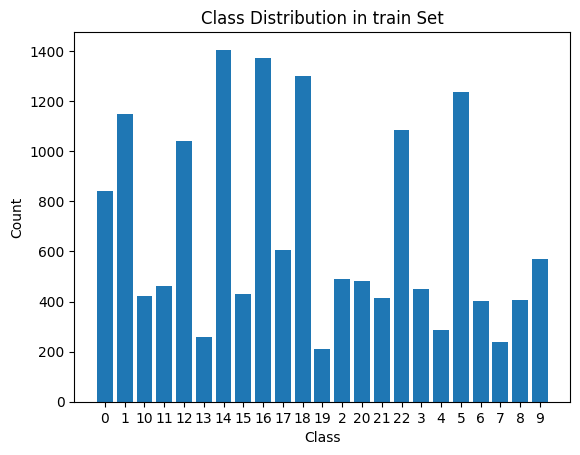

test Set Summary:
Total Samples: 4
Class Distribution: {'0': 312, '1': 288, '10': 105, '11': 116, '12': 261, '13': 65, '14': 352, '15': 108, '16': 343, '17': 152, '18': 325, '19': 53, '2': 123, '20': 121, '21': 105, '22': 272, '3': 113, '4': 73, '5': 309, '6': 101, '7': 60, '8': 102, '9': 143}



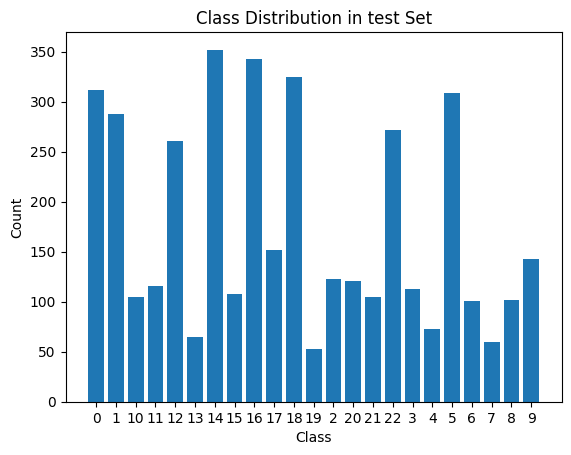

In [5]:
# Print summaries for all datasets
dataset_summary("train")
# dataset_summary("val")
dataset_summary("test")

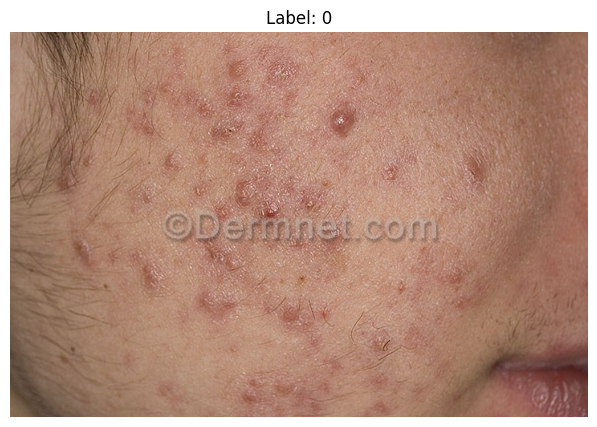

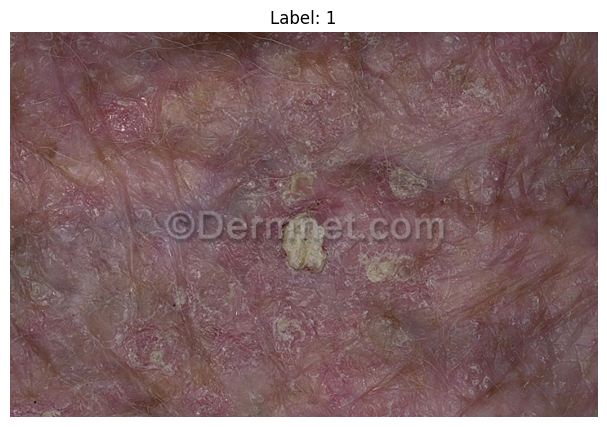

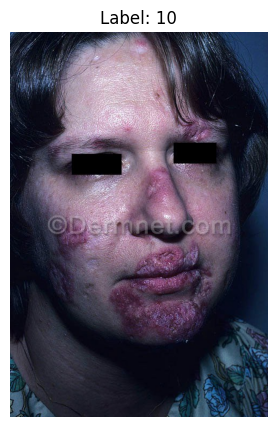

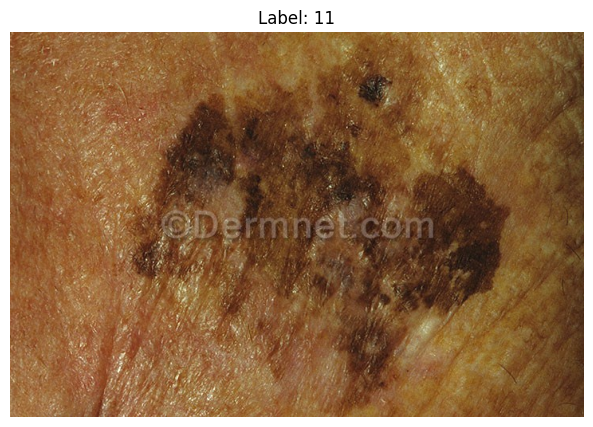

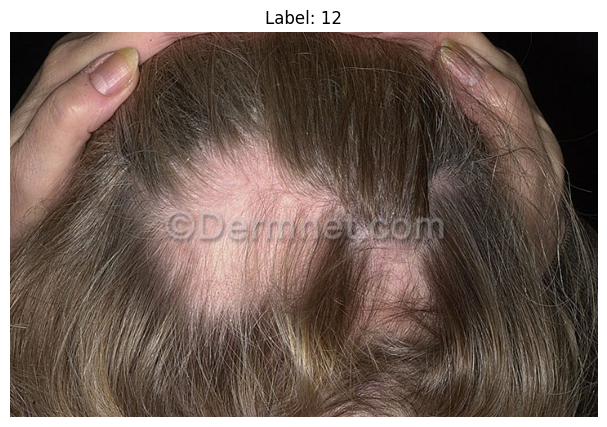

...

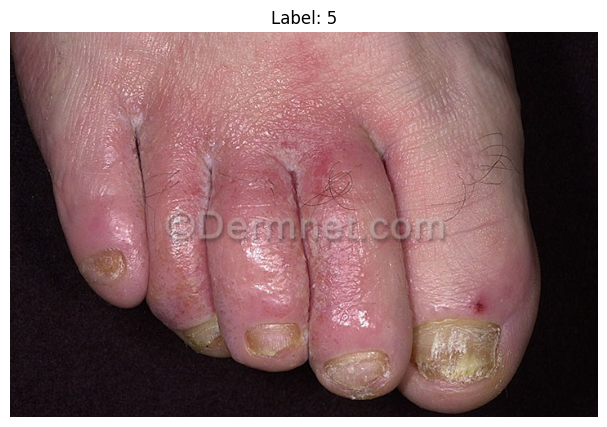

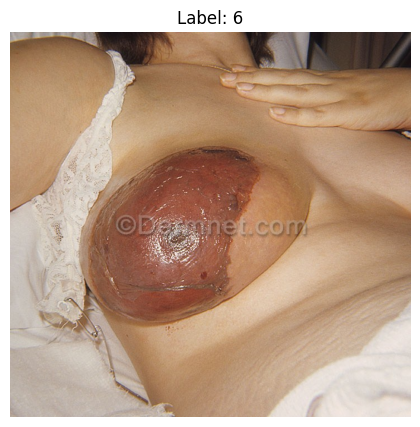

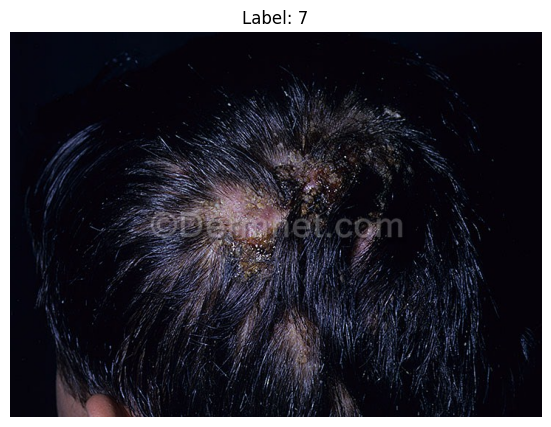

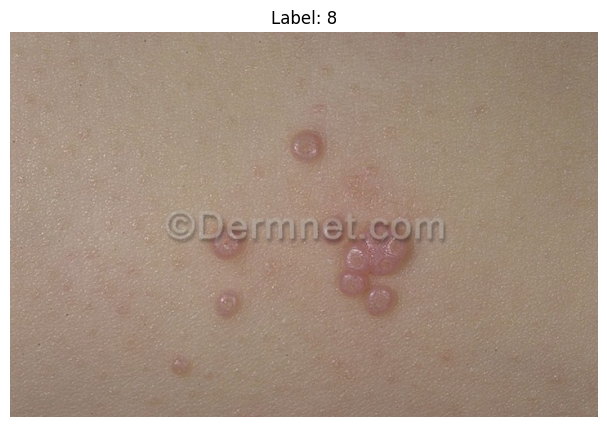

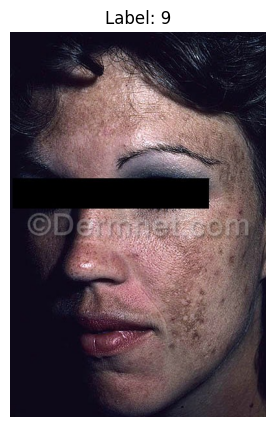

In [54]:
# Visualize random images
show_random_images('train',1)

In [11]:
# Inspect train dataset
inspect_image_data('train')

Image Height: Min = 314, Max = 720
Image Width: Min = 3, Max = 3
Pixel Intensity Mean: 113.7294
Pixel Intensity Std: 50.0179


In [6]:
# Apply and show Transformation
# show_transformed_images('train',1)

## Training

In [6]:
# Weighted Random Sampler
def get_sampler(dataset):
    labels = [label for _, label in dataset]
    class_sample_counts = Counter(labels)
    class_weights = 1. / torch.tensor([class_sample_counts[label] for label in labels], dtype=torch.float)
    sample_weights = [class_weights[label] for label in labels]
    sampler = WeightedRandomSampler(sample_weights, num_samples=len(sample_weights), replacement=True)
    return sampler

BATCH_SIZE = 16

#Load Datasets
train_dataset = ImageFolder(folder_path + '/train', transform=my_transform)
test_dataset = ImageFolder(folder_path + '/test', transform=my_transform)

val_size = int(0.5 * len(test_dataset))  # 50% for validation
test_size = len(test_dataset) - val_size
val_dataset, test_dataset = random_split(test_dataset, [val_size, test_size])

with open('test_dataset.pickle', 'wb') as handle:
    pickle.dump(test_dataset, handle, protocol=pickle.HIGHEST_PROTOCOL)

train_sampler = get_sampler(train_dataset)
val_sampler = get_sampler(val_dataset)

# Create DataLoaders
train_loader = DataLoader(train_dataset, batch_size=BATCH_SIZE, sampler=train_sampler)
val_loader = DataLoader(val_dataset, batch_size=BATCH_SIZE, sampler=val_sampler)
test_loader = DataLoader(test_dataset, batch_size=BATCH_SIZE, shuffle=False)

In [7]:
classifier_size = 32

# Load pre-trained models (e.g., ResNet, MobileNet, EfficientNet)
def replace_classifier(in_features, num_classes=23):
    return Sequential(
        Linear(in_features, classifier_size),
        ReLU(),
        Dropout(0.5),
        Linear(classifier_size, num_classes)
    )

def initialize_weights(module):
    if isinstance(module, Linear):
        nn.init.xavier_uniform_(module.weight)

def get_model(model_name, freeze_layers=False):
    if model_name == "resnet50":
        weights = ResNet50_Weights.DEFAULT
        model = models.resnet50(weights=weights)
        if freeze_layers:
            for param in model.parameters():
                param.requires_grad = False
        model.fc = replace_classifier(model.fc.in_features)
        model.fc.apply(initialize_weights)

    elif model_name == "mobilenet_v2":
        weights = MobileNet_V2_Weights.DEFAULT
        model = models.mobilenet_v2(weights=weights)
        if freeze_layers:
            for param in model.features.parameters():
                param.requires_grad = False
        model.classifier[-1] = replace_classifier(model.last_channel)
        model.classifier[-1].apply(initialize_weights)

    elif model_name == "efficientnet_b0":
        weights = EfficientNet_B0_Weights.DEFAULT
        model = models.efficientnet_b0(weights=weights)
        if freeze_layers:
            for param in model.parameters():
                param.requires_grad = False
        model.classifier[1] = replace_classifier(model.classifier[1].in_features)
        model.classifier[1].apply(initialize_weights)

    elif model_name == "inception_v3":
        weights = Inception_V3_Weights.DEFAULT
        model = models.inception_v3(weights=weights)
        if freeze_layers:
            for param in model.parameters():
                param.requires_grad = False
        model.fc = replace_classifier(model.fc.in_features)
        model.fc.apply(initialize_weights)

    elif model_name == "densenet201":
        weights = DenseNet201_Weights.DEFAULT
        model = models.densenet201(weights=weights)
        if freeze_layers:
            for param in model.parameters():
                param.requires_grad = False
        model.classifier = replace_classifier(model.classifier.in_features)
        model.classifier.apply(initialize_weights)

    elif model_name == "densenet161":
        weights = DenseNet161_Weights.DEFAULT
        model = models.densenet161(weights=weights)
        
        if freeze_layers:
            for param in model.parameters():
                param.requires_grad = False
        model.classifier = replace_classifier(model.classifier.in_features)
        model.classifier.apply(initialize_weights)
    
    elif model_name == "googlenet":
        weights = GoogLeNet_Weights.DEFAULT
        model = models.googlenet(weights=weights)
        if freeze_layers:
            for param in model.parameters():
                param.requires_grad = False
        model.fc = replace_classifier(model.fc.in_features)
        model.fc.apply(initialize_weights)

    elif model_name == "vgg19":
        weights = VGG19_Weights.DEFAULT
        model = models.vgg19(weights=weights)
        if freeze_layers:
            for param in model.features.parameters():
                param.requires_grad = False
        model.classifier[-1] = replace_classifier(model.classifier[-1].in_features)
        model.classifier[-1].apply(initialize_weights)

    else:
        raise ValueError(f"Unsupported model name: {model_name}")

    return model

In [14]:
# Early stopping implementation
class EarlyStopping:
    def __init__(self, patience=5, min_delta=0):
        self.patience = patience
        self.min_delta = min_delta
        self.counter = 0
        self.best_loss = None

    def should_stop(self, val_loss):
        if self.best_loss is None or val_loss < self.best_loss - self.min_delta:
            self.best_loss = val_loss
            self.counter = 0
            return False
        else:
            self.counter += 1
            if self.counter >= self.patience:
                return True
        return False

FREEZE_LAYERS = False

# Train each model
def train_model_with_val(model, train_loader, val_loader, epochs, model_name):
    model = model.to(device)
    optimizer = Adam(model.parameters(), lr=1e-4)
    criterion = CrossEntropyLoss()
    early_stopping = EarlyStopping(patience=5, min_delta=0.01)
    scheduler = ReduceLROnPlateau(optimizer, mode='min', factor=0.05, patience=5)

    mlflow.set_experiment("Skin-Classification - CNN - Exp 1")
    with mlflow.start_run():
        mlflow.log_param("Model", model_name)
        mlflow.log_param("Epochs", epochs)
        mlflow.log_param("Batch_Size", BATCH_SIZE)
        mlflow.log_param("freeze_layers", FREEZE_LAYERS)
        mlflow.log_param("classifier_size", classifier_size)
        mlflow.log_param("Learning_Rate", 1e-4)
        mlflow.log_param("Scheduler_Patience", 5)
        mlflow.log_param("Scheduler_Factor", 0.05)

        for epoch in range(epochs):
            start_time = time.time()
            # Training phase
            model.train()
            train_loss = 0
            for images, labels in train_loader:
                images, labels = images.to(device), labels.to(device)
                optimizer.zero_grad()
                outputs = model(images)
                loss = criterion(outputs, labels)
                loss.backward()
                optimizer.step()
                train_loss += loss.item()

            train_loss /= len(train_loader)

            # Validation phase
            model.eval()
            val_loss = 0
            correct, total = 0, 0
            with torch.no_grad():
                for images, labels in val_loader:
                    images, labels = images.to(device), labels.to(device)
                    outputs = model(images)
                    loss = criterion(outputs, labels)
                    val_loss += loss.item()
                    probabilities = softmax(outputs, dim=1)
                    _, preds = probabilities.max(1)

                    # _, preds = outputs.max(1)
                    correct += (preds == labels).sum().item()
                    total += labels.size(0)
            val_loss /= len(val_loader)
            val_accuracy = correct / total

            end_time = time.time()

            mlflow.log_metric("Train_Loss", train_loss, epoch)
            mlflow.log_metric("Val_Loss", val_loss, epoch)
            mlflow.log_metric("Val_Accuracy", val_accuracy, epoch)
            mlflow.log_metric("Epoch_Time_seconds", end_time - start_time, epoch)  # Updated parameter name
            mlflow.log_metric("Learning_Rate", optimizer.param_groups[0]['lr'], epoch)
            scheduler.step(val_loss)
            print(f"Epoch {epoch+1}/{epochs}, Train Loss: {train_loss/len(train_loader):.4f}, "
                  f"Val Loss: {val_loss/len(val_loader):.4f}, Val Accuracy: {correct/total:.4f}")

            # Check for early stopping
            if early_stopping.should_stop(val_loss):
                print(f"Stopping early at epoch {epoch+1}")
                break
        torch.save(model, folder_path + '/retrained_' + model_name + '.pt')
        torch.cuda.empty_cache() # Clear cache after each model

In [16]:
# Train for Max. 50 epochs
N_EPOCHS = 50

model_list = [
    "densenet201",
    "resnet50",
    "mobilenet_v2",
    "efficientnet_b0",
    "densenet161",
]

for model_name in model_list:
  print("Strarted training......" + model_name)
  model = get_model(model_name, freeze_layers=FREEZE_LAYERS)
  train_model_with_val(model, train_loader, val_loader, epochs=N_EPOCHS, model_name=model_name)

## Model Evaluation

In [18]:
def evaluate_model(model, test_loader):
    model.eval()
    all_preds = []
    all_top5_prob = []
    all_top5 = []
    all_labels = []
    top5_accuracy = 0
    num = 0
    den = 0
    
    with torch.no_grad():
        for images, labels in test_loader:
            images, labels = images.to(device), labels.to(device)
            outputs = model(images)
            probabilities = softmax(outputs, dim=1)
            _, preds = probabilities.max(1)
            top5_prob, top5_indices = torch.topk(probabilities, 5)

            preds = preds.cpu()
            labels = labels.cpu()
            top5_prob = top5_prob.cpu()
            top5_indices = top5_indices.cpu()
            all_preds.append(preds)
            all_labels.append(labels)
            all_top5_prob.append(top5_prob)
            all_top5.append(top5_indices)

            for row in range(len(labels)):
                if labels[row] in top5_indices[row]:
                    num = num + 1
                den = den + 1
            
    
    all_preds = torch.cat(all_preds)
    all_labels = torch.cat(all_labels)

    top5_accuracy = num/den
    top5_accuracy *= 100

    print("Classification Report:")
    print(classification_report(all_labels, all_preds, target_names=train_classes))

    print("Confusion Matrix:")
    print(confusion_matrix(all_labels, all_preds))

    print("Top5 accuracy:", top5_accuracy)


for model_name in model_list:
  model = torch.load(folder_path + '/retrained_' + model_name + '.pt', weights_only=False)
  model.to(device)
  print(model_name)
  evaluate_model(model, test_loader)

densenet201
Classification Report:
              precision    recall  f1-score   support

           0       0.85      0.90      0.87       157
           1       0.66      0.69      0.68       124
          10       0.37      0.35      0.36        55
          11       0.60      0.73      0.66        64
          12       0.79      0.85      0.82       126
          13       0.50      0.06      0.10        35
          14       0.46      0.58      0.51       168
          15       0.54      0.31      0.40        61
          16       0.63      0.58      0.60       170
          17       0.40      0.47      0.43        75
          18       0.77      0.64      0.70       161
          19       0.55      0.57      0.56        30
           2       0.42      0.58      0.48        55
          20       0.68      0.60      0.64        63
          21       0.44      0.60      0.51        53
          22       0.66      0.54      0.59       141
           3       0.44      0.32      0.37   

In [ ]:
with open('test_dataset.pickle', 'wb') as handle:
    test_dataset = pickle.load(handle)

test_loader = DataLoader(test_dataset, batch_size=BATCH_SIZE, shuffle=False)

In [ ]:
from pytorch_grad_cam import GradCAM, HiResCAM, ScoreCAM, GradCAMPlusPlus, AblationCAM, XGradCAM, EigenCAM, FullGrad
from pytorch_grad_cam.utils.model_targets import ClassifierOutputTarget
from pytorch_grad_cam.utils.image import show_cam_on_image
from torchvision.models import resnet50

model = resnet50(pretrained=True)
target_layers = [model.layer4[-1]]
input_tensor = # Create an input tensor image for your model..
# Note: input_tensor can be a batch tensor with several images!

# We have to specify the target we want to generate the CAM for.
targets = [ClassifierOutputTarget(281)]

# Construct the CAM object once, and then re-use it on many images.
with GradCAM(model=model, target_layers=target_layers) as cam:
  # You can also pass aug_smooth=True and eigen_smooth=True, to apply smoothing.
  grayscale_cam = cam(input_tensor=input_tensor, targets=targets)
  # In this example grayscale_cam has only one image in the batch:
  grayscale_cam = grayscale_cam[0, :]
  visualization = show_cam_on_image(rgb_img, grayscale_cam, use_rgb=True)
  # You can also get the model outputs without having to redo inference
  model_outputs = cam.outputs